# Introduction to NLP fundamentals in TensorFlow

NLP has the goal of deriving information out of natural language (could be sequences text or speech).
Another common term for NLP problems is sequence to sequence problems (seq2seq)

Resources:

https://kawine.github.io/blog/nlp/2019/06/21/word-analogies.html
https://jalammar.github.io/illustrated-word2vec/
https://kawine.github.io/blog/nlp/2019/06/21/word-analogies.html
https://nlp.stanford.edu/projects/glove/
https://www.tensorflow.org/tutorials/load_data/text
https://www.tensorflow.org/text/guide/word_embeddings
https://www.tensorflow.org/tutorials/load_data/text
https://scikit-learn.org/stable/tutorial/text_analytics/working_with_text_data.html
https://scikit-learn.org/stable/modules/model_evaluation.html

**ABOUT RNN**
http://introtodeeplearning.com/     
https://colah.github.io/posts/2015-08-Understanding-LSTMs/
https://jalammar.github.io/illustrated-word2vec/
http://karpathy.github.io/2015/05/21/rnn-effectiveness/

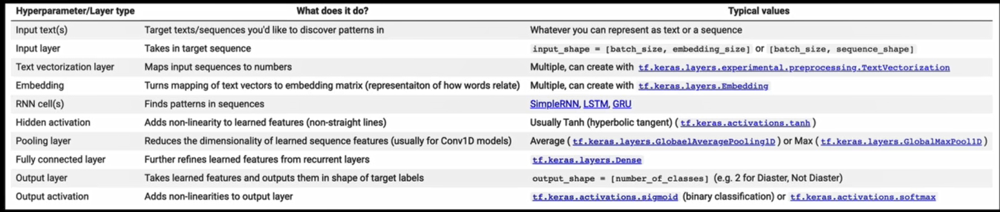

## Check for GPU

In [1]:
!nvidia-smi -L
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], enable=True)

GPU 0: Tesla T4 (UUID: GPU-0c48ec95-34f8-427a-232a-daa32b7f4aaa)


In [2]:
## Get helper functions
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

--2022-08-21 14:17:37--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2022-08-21 14:17:37 (64.7 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [3]:
from helper_functions import create_tensorboard_callback, unzip_data, plot_loss_curves, compare_historys

## Get a text dataset

The dataset we're going to use is Kaggle's introduction to NLP dataset (text samples of tweets labelled as diaster or not diaster).
Original dataset: https://www.kaggle.com/competitions/nlp-getting-started

From course: https://storage.googleapis.com/ztm_tf_course/nlp_getting_started.zip

In [4]:
!wget https://storage.googleapis.com/ztm_tf_course/nlp_getting_started.zip

--2022-08-21 14:17:38--  https://storage.googleapis.com/ztm_tf_course/nlp_getting_started.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.65.80, 142.251.33.208, 172.217.164.144, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.65.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 607343 (593K) [application/zip]
Saving to: ‘nlp_getting_started.zip’

nlp_getting_started 100%[===================>] 593.11K  --.-KB/s    in 0.004s  

2022-08-21 14:17:38 (148 MB/s) - ‘nlp_getting_started.zip’ saved [607343/607343]



In [5]:
unzip_data('/content/nlp_getting_started.zip')

## Visualizing the text dataset

To visualize our text samples, we first have to read them in, one way to do so would be to use simple python.
But pandas can be used to load in the data. Keep in mind that dataset can only be loaded into pandas if you have enough ram.

Try tensorflow too : https://www.tensorflow.org/tutorials/load_data/text

In [6]:
import pandas as pd

train_df=pd.read_csv('train.csv')
test_df=pd.read_csv('test.csv')

In [7]:
train_df.head(5)

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1


In [8]:
train_df['text'][1]

'Forest fire near La Ronge Sask. Canada'

In [9]:
# Shuffle Training dataframe
train_df_shuffled=train_df.sample(frac=1,random_state=42)
train_df_shuffled.head(5)

,id,keyword,location,text,target
2644,3796,destruction,NaN,So you have a new weapon that can cause un-ima...,1
2227,3185,deluge,NaN,The f$&amp;@ing things I do for #GISHWHES Just...,0
5448,7769,police,UK,DT @georgegalloway: RT @Galloway4Mayor: ÛÏThe...,1
132,191,aftershock,NaN,Aftershock back to school kick off was great. ...,0
6845,9810,trauma,"Montgomery County, MD",in response to trauma Children of Addicts deve...,0


In [10]:
# What does the text dataframe looks like
# Notice no target column
test_df.head(5)

,id,keyword,location,text
0,0,NaN,NaN,Just happened a terrible car crash
1,2,NaN,NaN,"Heard about #earthquake is different cities, s..."
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are..."
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan


In [11]:
train_df.target.value_counts()

0    4342
1    3271
Name: target, dtype: int64

The dataset is pretty balanced, if it wasn't balanced see: https://www.tensorflow.org/tutorials/structured_data/imbalanced_data

In [12]:
len(train_df),len(test_df)

(7613, 3263)

In [13]:
# Let's visualize some random training samples
import random
random_index=random.randint(0,len(train_df)-5)#create random indexes not higher than len of dataframe
for row in train_df_shuffled[['text','target']][random_index:random_index+5].itertuples():
  _,text,target=row
  print(f"Target:{target}", "(real diaster)" if target>0 else "(not real diaster)")
  print(f"Text:\n {text}\n")
  print('---\n')

Target:0 (not real diaster)
Text:
 Kids are inundated with images and information online and in media and have no way to deconstruct. - Kerri Sackville #TMS7

---

Target:1 (real diaster)
Text:
 Ashes 2015: AustraliaÛªs collapse at Trent Bridge among worst in history: England bundled out Australia for 60 ... http://t.co/985DwWPdEt

---

Target:1 (real diaster)
Text:
 Heat wave in WB heavy losses and no compensations (report) -  http://t.co/wMDihdiz1r (via PalinfoEn)   #Palestine

---

Target:1 (real diaster)
Text:
 @sonofbobBOB @Shimmyfab @trickxie usually I'd agree. Once the whole chopping heads off throwing gays off rooftops &amp; suicide bombing start

---

Target:0 (not real diaster)
Text:
 All these people explode ????

---



In [14]:
total=0
for sen in train_df_shuffled['text']:
  total=total+len(sen.split())
avg=total/len(train_df_shuffled)

In [15]:
avg

14.903585971364771

So the average length of the sentences is 14.9.

## Creating validation dataset

Since the test dataset doesn't have any labels we need to create a dataset to evaluate our model on 

In [16]:
from sklearn.model_selection import train_test_split

In [17]:
train_sentences, val_sentences, train_labels, val_labels = train_test_split(train_df_shuffled['text'].to_numpy(), 
                                                                        train_df_shuffled['target'].to_numpy(), 
                                                                        test_size=0.1, 
                                                                        random_state=42)

In [18]:
len(train_sentences),len(train_labels),len(val_sentences),len(val_labels)

(6851, 6851, 762, 762)

In [19]:
# check first 10 samples
train_sentences[:10], train_labels[:10]

(array(['@mogacola @zamtriossu i screamed after hitting tweet',
        'Imagine getting flattened by Kurt Zouma',
        '@Gurmeetramrahim #MSGDoing111WelfareWorks Green S welfare force ke appx 65000 members har time disaster victim ki help ke liye tyar hai....',
        "@shakjn @C7 @Magnums im shaking in fear he's gonna hack the planet",
        'Somehow find you and I collide http://t.co/Ee8RpOahPk',
        '@EvaHanderek @MarleyKnysh great times until the bus driver held us hostage in the mall parking lot lmfao',
        'destroy the free fandom honestly',
        'Weapons stolen from National Guard Armory in New Albany still missing #Gunsense http://t.co/lKNU8902JE',
        '@wfaaweather Pete when will the heat wave pass? Is it really going to be mid month? Frisco Boy Scouts have a canoe trip in Okla.',
        'Patient-reported outcomes in long-term survivors of metastatic colorectal cancer - British Journal of Surgery http://t.co/5Yl4DC1Tqt'],
       dtype=object), array([0, 

## Converting text into numbers

When dealing with a text problem, one of the first things you'll have to do before you can build a model is to convert your text to numbers.

There are a few ways too do this,namely:
* Tokenization - direct mapping of token (a token could be a word or a character) to number
* Embedding - create a matrix of feature vector of each token ( the size of the feature vector can be defined and this embedding can be learned)
read: https://www.tensorflow.org/text/guide/word_embeddings

Tokenization
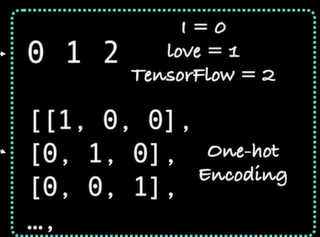

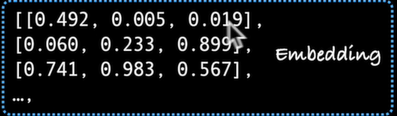

### Text vectorization ( tokenization)

In [20]:
train_sentences[:5]

array(['@mogacola @zamtriossu i screamed after hitting tweet',
       'Imagine getting flattened by Kurt Zouma',
       '@Gurmeetramrahim #MSGDoing111WelfareWorks Green S welfare force ke appx 65000 members har time disaster victim ki help ke liye tyar hai....',
       "@shakjn @C7 @Magnums im shaking in fear he's gonna hack the planet",
       'Somehow find you and I collide http://t.co/Ee8RpOahPk'],
      dtype=object)

In [21]:
import tensorflow as tf
from tensorflow.keras.layers import TextVectorization

In [22]:
#using default parameters
#max_tokens=None, how many words in vocab, if none no cap on size
#(auto add token <OOV> means out of vocab)
#split='whitespace' SPLIT ON THE BASIS OF WHITE SPACE
#ngrams=None #create groups of words?
#output mode can be 'binary', 'int' and 'tf-idf'
#how long you want sequeunces to be
text_vectorizer=TextVectorization(max_tokens=None,
                                  standardize="lower_and_strip_punctuation",
                                  split='whitespace',
                                  ngrams=None,
                                  output_mode='int',
                                  output_sequence_length=None,
                                  pad_to_max_tokens=None)

In [23]:
# Find the average numbers of tokens in the training tweets
round(sum([len(i.split()) for i in train_sentences])/len(train_sentences))

15

In [24]:
#setup text vectorization variable
max_vocab_length=10000 # max number of words that can be in vocab
max_length=15 #max length our sequences will be (how many words from a text does a model see)
#Now set them instead of default
text_vectorizer=TextVectorization(max_tokens=max_vocab_length,
                                  output_mode='int',
                                  output_sequence_length=max_length)

In [25]:
# fit the text vectorizer to the training text
text_vectorizer.adapt(train_sentences)

In [26]:
# create a sample sentences and tokenize it
sample_sentence="There's a flood in my street!"
text_vectorizer([sample_sentence])

<tf.Tensor: shape=(1, 15), dtype=int64, numpy=
array([[264,   3, 232,   4,  13, 698,   0,   0,   0,   0,   0,   0,   0,
          0,   0]])>

In [27]:
# Choose a random sentence from the training dataset and tokenize it

random_sentence=random.choice(train_sentences)
print(f'Original Text:\n {random_sentence} \
       \n\n Vectorized version:')
text_vectorizer([random_sentence])

Original Text:
 A tin of Tesco dog food 'exploded' and prompted THIS complaint - via @chelsea_dogs #pets #dogs #animals #puppy http://t.co/QzvKPaHsQ7        

 Vectorized version:


<tf.Tensor: shape=(1, 15), dtype=int64, numpy=
array([[   3, 4407,    6, 7705,  957,  260,  460,    7, 3512,   19,    1,
          49,    1, 3538, 1303]])>

In [28]:
#Get the unique words in the vocab
#[UNK] is unknown tokens mostly the ones were least used and the vocab size was limited 
words_in_vocab=text_vectorizer.get_vocabulary() # get all of the unique words in vocab

top_5_words=words_in_vocab[:5]
bottom_5_words=words_in_vocab[-5:]
print(f'Number of words in vocab: {len(words_in_vocab)}')
print(f'top 5 words in vocab: {top_5_words}')
print(f'Bottom 5 words in vocab: {bottom_5_words}')

Number of words in vocab: 10000
top 5 words in vocab: ['', '[UNK]', 'the', 'a', 'in']
Bottom 5 words in vocab: ['pages', 'paeds', 'pads', 'padres', 'paddytomlinson1']


### Creating an Embedding using an Embedding Layer

Embedding layer converts positive integers into dense vectors of fixed size.

To make our embedding we're going to use tensorflow embedding layer.

The parameters we care most about for our embedding layer:
* `input_dim` = the size of our vocab
* `output_dim`= the size of the output embedding vector, for example, a value of 100 would mean each token gets represented by a vector 100 long
* `input_length` = Length of the sequences being passed to embedding layer

In [29]:
from tensorflow.keras.layers import Embedding

In [30]:
embedding= Embedding(input_dim=max_vocab_length,
                     output_dim=128,
                     embeddings_initializer='uniform',
                     input_length=max_length)

In [31]:
# get another random sentence from train data
random_sentence=random.choice(train_sentences)
random_sentence=random.choice(train_sentences)
print(f'Original Text:\n {random_sentence} \
       \n\n Embedded version:')
sample_embed=embedding(text_vectorizer([random_sentence]))
sample_embed

Original Text:
 Wrecked emotions.        

 Embedded version:


<tf.Tensor: shape=(1, 15, 128), dtype=float32, numpy=
array([[[-0.03314217,  0.03732476,  0.00225206, ...,  0.01644086,
         -0.013358  , -0.03347705],
        [-0.04561466,  0.01085548, -0.02956343, ...,  0.03295681,
         -0.03251084,  0.03842607],
        [ 0.00370613, -0.04469745, -0.02338787, ..., -0.04202961,
          0.01612448,  0.02909319],
        ...,
        [ 0.00370613, -0.04469745, -0.02338787, ..., -0.04202961,
          0.01612448,  0.02909319],
        [ 0.00370613, -0.04469745, -0.02338787, ..., -0.04202961,
          0.01612448,  0.02909319],
        [ 0.00370613, -0.04469745, -0.02338787, ..., -0.04202961,
          0.01612448,  0.02909319]]], dtype=float32)>

shape=(1, 15, 128) 
let's break it down. there is 1 sentence and it is limited to 15 words and every word has 128 length long dense vector

In [32]:
# check out a single token's embedding
sample_embed[0][0],sample_embed[0][0].shape,random_sentence

(<tf.Tensor: shape=(128,), dtype=float32, numpy=
 array([-3.3142172e-02,  3.7324760e-02,  2.2520646e-03,  2.6296377e-03,
         3.0638721e-02,  3.3780728e-02, -6.0337074e-03, -3.6028933e-02,
         1.3656888e-02, -3.3332705e-02, -3.2003559e-02,  6.2289014e-03,
        -3.8572401e-04, -1.4217902e-02, -3.6384761e-02,  4.2159930e-03,
         4.2969212e-03,  8.9060515e-05, -3.5650719e-02,  1.9857112e-02,
         1.7580166e-03, -3.7381031e-02,  2.4033915e-02, -5.4054148e-03,
         4.1817907e-02,  3.6501992e-02, -3.2374941e-02,  3.4539852e-02,
        -2.6867200e-02,  1.6744088e-02, -4.8598301e-02, -4.8404325e-02,
         4.2943731e-03, -3.2927036e-02, -1.4328100e-02,  4.7498178e-02,
        -1.9746089e-02, -2.8354848e-02, -2.9924143e-02, -8.0712885e-04,
        -8.2395449e-03, -4.4990934e-02, -3.3484019e-02, -4.9763955e-02,
        -1.0995530e-02,  2.6418898e-02,  4.2858236e-03,  2.0956408e-02,
         2.0521451e-02, -4.2305361e-02, -4.7110856e-02,  3.2440994e-02,
        -1.1154

## Experiments We are going to perform

0. Naive bayes with TF-IDF encoder(baseline)
1. Feed forward neural network(dense model)
2. LSTM(RNN)
3. GRU(RNN)
4. Bidirectional-LSTM (RNN)
5. 1D Convolutional Neural Network
6. Tensorflow hub pretrained feature extractor
7. Tensorflow pretrained feature extractor (10% data)

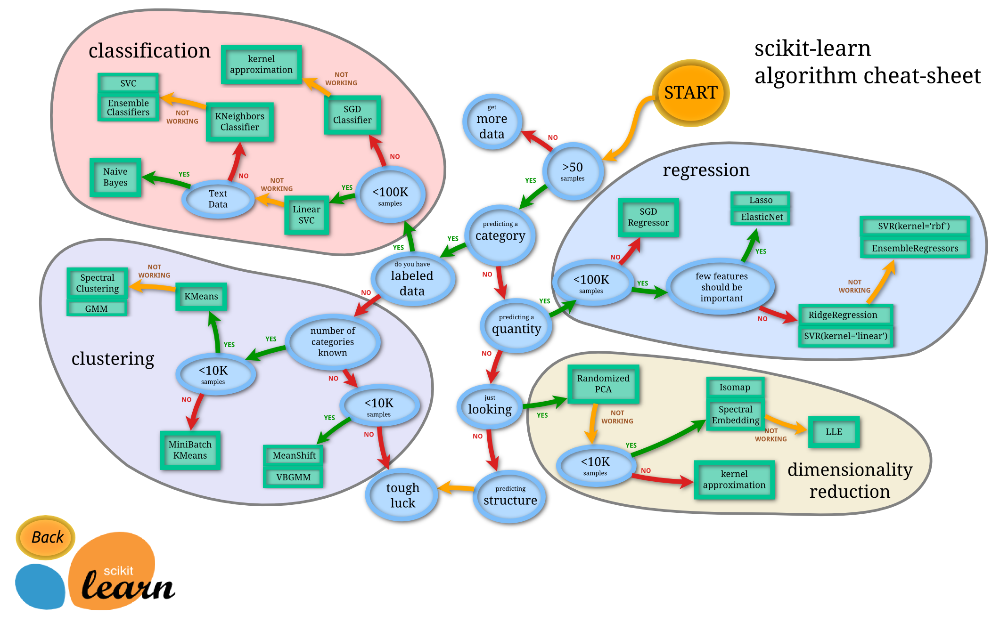

### Baseline model

It's common practice to use non DL algorithm as baseline because of their speeds then try using DL to see if there's an improvement


  Why not using count vectorizer here? Because we are using Tfidf Vectorizer here instead of Tfidf transformer which does the job of count vectorizer

In [33]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

model0=Pipeline([
    ('tfidf',TfidfVectorizer()),
    ('naive',MultinomialNB())])

model0.fit(train_sentences,train_labels)

Pipeline(steps=[('tfidf', TfidfVectorizer()), ('naive', MultinomialNB())])

In [34]:
# Evaluate the baseline model
baseline_score=model0.score(val_sentences,val_labels)
baseline_score

0.7926509186351706

In [35]:
baseline_pred=model0.predict(val_sentences)
baseline_pred[:20]

array([1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1])

## Creating a model evaluation function 
* Accuracy
* Precision
* recall
* f1-score

In [36]:
from sklearn.metrics import accuracy_score,precision_recall_fscore_support
def evaluate_metrics(y_true,y_pred):
  model_accuracy=accuracy_score(y_true,y_pred)
  model_precision,model_recall,model_f1,_=precision_recall_fscore_support(y_true,y_pred,average='weighted')
  model_results={'accuracy':model_accuracy,
                 'precision':model_precision,
                 'recall':model_recall,
                 'f1-score':model_f1}
  return model_results

In [37]:
# get baseline results
baseline_results=evaluate_metrics(val_labels,baseline_pred)

In [38]:
baseline_results

{'accuracy': 0.7926509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1-score': 0.7862189758049549}

### Model 1: Feed forward neural network

In [39]:
#Create a tensorflow callback
from helper_functions import create_tensorboard_callback
SAVE_DIR='model_logs'

In [40]:
# input is 1D string
input=tf.keras.Input(shape=(1,),dtype=tf.string)
# text vectorizer
x=text_vectorizer(input)
#Embedding layer
x=embedding(x)

# adding global average pooling
x=tf.keras.layers.GlobalAveragePooling1D()(x)
#Dense layer
output=tf.keras.layers.Dense(1,activation='sigmoid')(x)

model1=tf.keras.Model(input,output,name='model1_dense')

In [41]:
model1.summary()

Model: "model1_dense"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 text_vectorization_1 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding (Embedding)       (None, 15, 128)           1280000   
                                                                 
 global_average_pooling1d (G  (None, 128)              0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 1,280,129
Trainable params: 1,280,129
No

In [42]:
model1.compile(loss='binary_crossentropy',
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [43]:
history1=model1.fit(train_sentences,train_labels,
                    epochs=5,
                    validation_data=(val_sentences,val_labels),
                    callbacks=[create_tensorboard_callback(dir_name=SAVE_DIR,
                                                           experiment_name='dense')])

Saving TensorBoard log files to: model_logs/dense/20220821-141742
Epoch 1/5
215/215 [==============================] - 8s 9ms/step - loss: 0.6135 - accuracy: 0.6888 - val_loss: 0.5378 - val_accuracy: 0.7493
Epoch 2/5
215/215 [==============================] - 2s 8ms/step - loss: 0.4430 - accuracy: 0.8190 - val_loss: 0.4719 - val_accuracy: 0.7822
Epoch 3/5
215/215 [==============================] - 2s 8ms/step - loss: 0.3480 - accuracy: 0.8591 - val_loss: 0.4582 - val_accuracy: 0.7940
Epoch 4/5
215/215 [==============================] - 2s 8ms/step - loss: 0.2856 - accuracy: 0.8894 - val_loss: 0.4702 - val_accuracy: 0.7927
Epoch 5/5
215/215 [==============================] - 2s 7ms/step - loss: 0.2389 - accuracy: 0.9091 - val_loss: 0.4788 - val_accuracy: 0.7887


In [44]:
model1.evaluate(val_sentences,val_labels)

24/24 [==============================] - 0s 4ms/step - loss: 0.4788 - accuracy: 0.7887


[0.47877582907676697, 0.7887139320373535]

In [45]:
model1_probs=model1.predict(val_sentences)

In [46]:
model1_preds=tf.squeeze(tf.round(model1_probs))

In [47]:
model1_results=evaluate_metrics(val_labels,model1_preds)

In [48]:
model1_results

{'accuracy': 0.7887139107611548,
 'precision': 0.7948464726843409,
 'recall': 0.7887139107611548,
 'f1-score': 0.7853694687698636}

In [49]:
baseline_results

{'accuracy': 0.7926509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1-score': 0.7862189758049549}

In [50]:
import numpy as np 
np.array(list(model1_results.values()))>np.array(list(baseline_results.values()))

array([False, False, False, False])

## Visualizing learned embeddings

In [51]:
# Get the vocab from the text vecorization layer
words_in_vocab=text_vectorizer.get_vocabulary()
len(words_in_vocab), words_in_vocab[:10]

(10000, ['', '[UNK]', 'the', 'a', 'in', 'to', 'of', 'and', 'i', 'is'])

In [52]:
model1.summary()

Model: "model1_dense"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 text_vectorization_1 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding (Embedding)       (None, 15, 128)           1280000   
                                                                 
 global_average_pooling1d (G  (None, 128)              0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 1,280,129
Trainable params: 1,280,129
No

In [53]:
# Get the weight matrix of layers
# these are numerical representation of each token in our training data

embed_weights=model1.get_layer('embedding').get_weights()
embed_weights
print(embed_weights[0].shape) #this should be same vocab size and embedding _dim

(10000, 128)


Now we've got the embedding matrix our model has learned to represent our tokens, let's see how we can represent them.
check: https://projector.tensorflow.org/

In [54]:
# create embedding files (from tensorflow word embedding documentation)
import io
out_v = io.open('vectors.tsv', 'w', encoding='utf-8')
out_m = io.open('metadata.tsv', 'w', encoding='utf-8')

for index, word in enumerate(words_in_vocab):
  if index == 0:
    continue  # skip 0, it's padding.
  vec = embed_weights[0][index]
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
  out_m.write(word + "\n")
out_v.close()
out_m.close()

In [55]:
#Download data to upload to projector
try:
  from google.colab import files
  files.download('vectors.tsv')
  files.download('metadata.tsv')
except Exception:
  pass

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

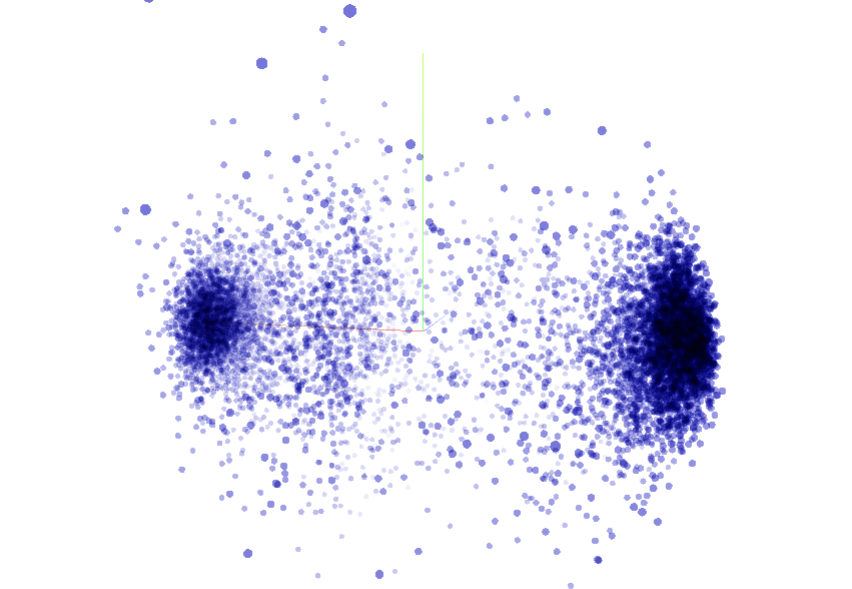

Projector tool is great as it allows us to project the weights etc to see how they are learning. We can clearly see two clusters. One cluster has words that appear alot in disaster tweets and one has common words that don't appear in a disaster tweets

## Recurrent Neural Network

RNN are useful for sequence data.

The premise of recurrent neural network is to use the representation of a previous input to aid the representation of the later input.

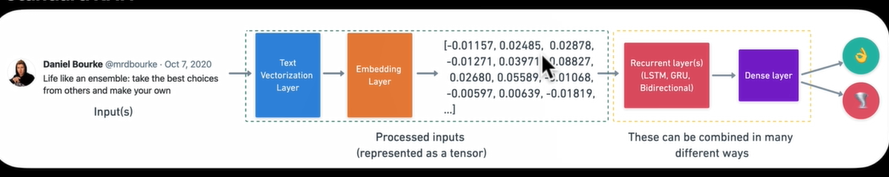

### Model 2: RNN with LSTM

our structure of RNN typically looks like this

```
Input (text) -> Tokenize -> Embedding -> Layers(RNNs/Dense) -> Output (label probability)
```
LSTM input [batchsize,timesteps,features]
total 3 Dimensions. Without return sequences=True, it will return 2d which will make stacking impossible



In [56]:
inputs=tf.keras.layers.Input(shape=(1,),dtype=tf.string)

x=text_vectorizer(inputs)
x=embedding(x)
print(x.shape)
#When you're stacking multiple layers of 
#lstm layers you need return_sequences=true
#x=tf.keras.layers.LSTM(64,return_sequences=True)(x)
#print(x.shape)
x=tf.keras.layers.LSTM(64)(x)
#print(x.shape)
#x= tf.keras.layers.Dense(64,activation='relu')(x)
outputs=tf.keras.layers.Dense(1,activation='sigmoid')(x)

model2=tf.keras.Model(inputs,outputs,name='model_2_LSTM')


(None, 15, 128)


(None, 15, 128)
(None, 15, 64)
(None, 64)

Since the return_sequences=True parameter was used in first LSTM layer that's why it keeps the 15 parameter. But when not used it returns. Which is without the max sentence length
(None, 64)

64 is reflective of units in layer.

In [57]:
#get summary

model2.summary()

Model: "model_2_LSTM"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1)]               0         
                                                                 
 text_vectorization_1 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding (Embedding)       (None, 15, 128)           1280000   
                                                                 
 lstm (LSTM)                 (None, 64)                49408     
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,329,473
Trainable params: 1,329,473
Non-trainable params: 0
____________________________________________

In [58]:
model2.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

Sometimes it might generate 
```
Fail to find the dnn implementation.
	 [[{{node CudnnRNN}}]]
	 [[model_2_LSTM/lstm/PartitionedCall]] [Op:__inference_train_function_10835]
   ```
   Error. Delete runtime and disconnect. then start again

In [59]:
# fit the model
history2=model2.fit(train_sentences,
                    train_labels,
                    epochs=5,
                    validation_data=(val_sentences,val_labels),
                    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                          'model2_lstm')])

Saving TensorBoard log files to: model_logs/model2_lstm/20220821-141802
Epoch 1/5
215/215 [==============================] - 10s 15ms/step - loss: 0.2208 - accuracy: 0.9238 - val_loss: 0.5681 - val_accuracy: 0.7835
Epoch 2/5
215/215 [==============================] - 2s 7ms/step - loss: 0.1585 - accuracy: 0.9438 - val_loss: 0.6047 - val_accuracy: 0.7861
Epoch 3/5
215/215 [==============================] - 2s 11ms/step - loss: 0.1282 - accuracy: 0.9533 - val_loss: 0.6900 - val_accuracy: 0.7756
Epoch 4/5
215/215 [==============================] - 3s 12ms/step - loss: 0.1066 - accuracy: 0.9629 - val_loss: 0.7897 - val_accuracy: 0.7835
Epoch 5/5
215/215 [==============================] - 3s 12ms/step - loss: 0.0831 - accuracy: 0.9666 - val_loss: 0.9798 - val_accuracy: 0.7769


In [60]:
model2_pred_probs=model2.predict(val_sentences)

In [61]:
model2_preds=tf.squeeze(tf.round(model2_pred_probs))
model2_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 0.], dtype=float32)>

In [62]:
model2_results=evaluate_metrics(val_labels,model2_preds)

In [63]:
model2_results

{'accuracy': 0.7769028871391076,
 'precision': 0.7809693289921038,
 'recall': 0.7769028871391076,
 'f1-score': 0.7739165030429329}

We can clearly see the overfitting in the model after few tries of changing parameters It doesn't stop. Try to reduce the output dims of embedding layer and reduce the vocab size. try adding and removing lstm layers

### Model 3: GRU

Another popular and effective RNN component is the GRU or gated recurrent unit.

The GRU cell has similar features to an LSTM cell but has less parameters.

To stack GRU you need return sequences=True

GRU and LSTM can also be stacked together

In [64]:
inputs=tf.keras.layers.Input(shape=(1,),dtype=tf.string)
x=text_vectorizer(inputs)
x=embedding(x)

x=tf.keras.layers.GRU(64)(x)
#x= tf.keras.layers.LSTM(64,return_sequences=True)(x)
#x=tf.keras.layers.GRU(64)(x)

#x=tf.keras.layers.Dense(64,activation='relu')(x)

outputs=tf.keras.layers.Dense(1,activation='sigmoid')(x)

model3=tf.keras.Model(inputs,outputs)

In [65]:
model3.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 1)]               0         
                                                                 
 text_vectorization_1 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding (Embedding)       (None, 15, 128)           1280000   
                                                                 
 gru (GRU)                   (None, 64)                37248     
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 1,317,313
Trainable params: 1,317,313
Non-trainable params: 0
___________________________________________________

In [66]:
model3.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [67]:
history3=model3.fit(train_sentences,
                        train_labels,
                        epochs=5,
                        validation_data=(val_sentences,val_labels),
                        callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                               'model3_GRU')])

Saving TensorBoard log files to: model_logs/model3_GRU/20220821-141826
Epoch 1/5
215/215 [==============================] - 5s 12ms/step - loss: 0.1631 - accuracy: 0.9301 - val_loss: 0.7433 - val_accuracy: 0.7730
Epoch 2/5
215/215 [==============================] - 2s 8ms/step - loss: 0.0838 - accuracy: 0.9693 - val_loss: 0.8848 - val_accuracy: 0.7717
Epoch 3/5
215/215 [==============================] - 2s 9ms/step - loss: 0.0701 - accuracy: 0.9740 - val_loss: 0.9746 - val_accuracy: 0.7756
Epoch 4/5
215/215 [==============================] - 2s 8ms/step - loss: 0.0614 - accuracy: 0.9745 - val_loss: 1.1448 - val_accuracy: 0.7743
Epoch 5/5
215/215 [==============================] - 2s 9ms/step - loss: 0.0546 - accuracy: 0.9764 - val_loss: 1.1517 - val_accuracy: 0.7690


In [68]:
model3_pred_probs=model3.predict(val_sentences)

In [69]:
model3_pred_probs[:10]

array([[4.7421157e-03],
       [8.4965461e-01],
       [9.9980778e-01],
       [7.6166458e-02],
       [7.8315767e-05],
       [9.9962795e-01],
       [9.7607577e-01],
       [9.9994469e-01],
       [9.9986386e-01],
       [7.3049802e-01]], dtype=float32)

In [70]:
# Convert to labels
model3_preds=tf.squeeze(tf.round(model3_pred_probs))
model3_preds[:10]

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([0., 1., 1., 0., 0., 1., 1., 1., 1., 1.], dtype=float32)>

In [71]:
model3_results=evaluate_metrics(val_labels,model3_preds)

In [72]:
model3_results

{'accuracy': 0.7690288713910761,
 'precision': 0.7691242349168363,
 'recall': 0.7690288713910761,
 'f1-score': 0.7678647757387915}

### Model 4: Bidirectional RNN

Normal RNN's go from left to right (just like you'd read an English sentence) however bidirectional RNN go from left to right and right to left.

Since the model goes both ways if LSTM with 64 units is created, its output will be 128 instead of 64

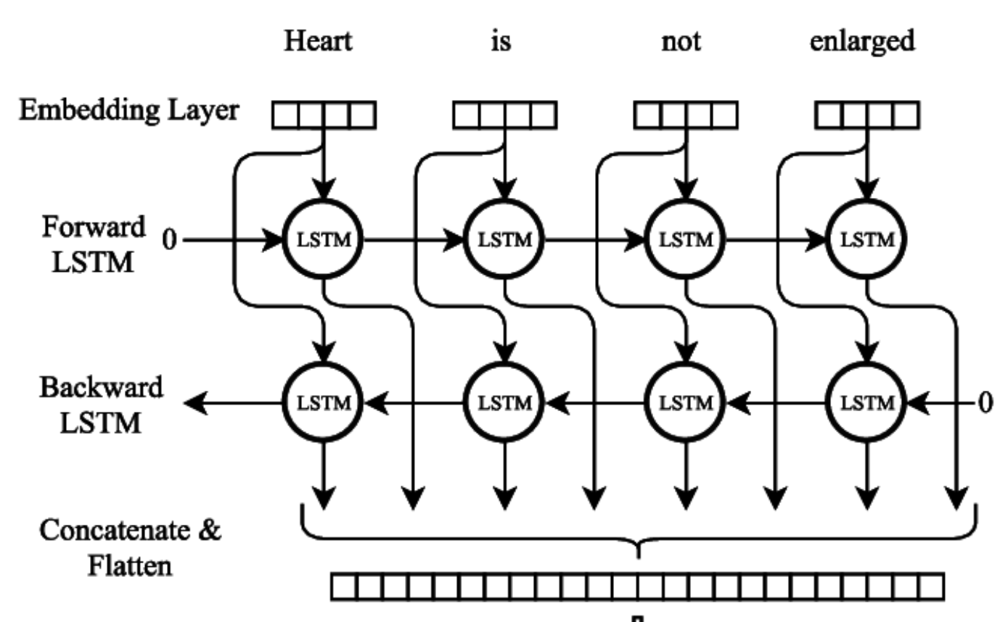

In [73]:
inputs=tf.keras.layers.Input(shape=(1,),dtype=tf.string)

x=text_vectorizer(inputs)
x=embedding(x)

x=tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64))(x)
#x=tf.keras.layers.Bidirectional(tf.keras.layers.GRU(64))(x)

outputs=tf.keras.layers.Dense(1,activation="sigmoid")(x)

model4=tf.keras.Model(inputs,outputs)

In [74]:
model4.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 1)]               0         
                                                                 
 text_vectorization_1 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding (Embedding)       (None, 15, 128)           1280000   
                                                                 
 bidirectional (Bidirectiona  (None, 128)              98816     
 l)                                                              
                                                                 
 dense_3 (Dense)             (None, 1)                 129       
                                                                 
Total params: 1,378,945
Trainable params: 1,378,945
Non-tra

In [75]:
model4.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [76]:
history4=model4.fit(train_sentences,
           train_labels,
           epochs=5,
           validation_data=(val_sentences,val_labels),
           callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                  'model4_bidirectional')])

Saving TensorBoard log files to: model_logs/model4_bidirectional/20220821-141841
Epoch 1/5
215/215 [==============================] - 8s 18ms/step - loss: 0.1034 - accuracy: 0.9704 - val_loss: 0.9478 - val_accuracy: 0.7612
Epoch 2/5
215/215 [==============================] - 3s 12ms/step - loss: 0.0523 - accuracy: 0.9771 - val_loss: 1.3215 - val_accuracy: 0.7677
Epoch 3/5
215/215 [==============================] - 2s 10ms/step - loss: 0.0451 - accuracy: 0.9797 - val_loss: 1.2480 - val_accuracy: 0.7782
Epoch 4/5
215/215 [==============================] - 3s 12ms/step - loss: 0.0429 - accuracy: 0.9796 - val_loss: 1.3769 - val_accuracy: 0.7664
Epoch 5/5
215/215 [==============================] - 2s 11ms/step - loss: 0.0432 - accuracy: 0.9819 - val_loss: 1.4058 - val_accuracy: 0.7808


In [77]:
model4_pred_probs=model4.predict(val_sentences)

In [78]:
model4_preds=tf.squeeze(tf.round(model4_pred_probs))

In [79]:
model4_results=evaluate_metrics(val_labels,model4_preds)

In [80]:
model4_results

{'accuracy': 0.7808398950131233,
 'precision': 0.783783808499639,
 'recall': 0.7808398950131233,
 'f1-score': 0.7783998521836788}

### Model 5: Conv1d

previously we've used conv2d for our image data and now we will use conv1d.

Kernel=5 means kernel looks at 5 words at a time. since stride is 1 by the default it will skip 1 from behind and check next 5.

It is also referred to ngrams=5 since it looks at 5 words. Padding = valid means the output is smaller than the input and same means output is same as the input

For padding check image below

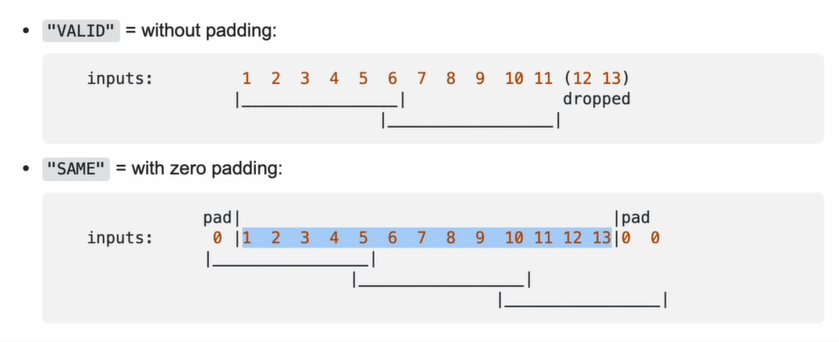

In [81]:
inputs=tf.keras.layers.Input(shape=(1,),dtype=tf.string)

x=text_vectorizer(inputs)
x=embedding(x)

x=tf.keras.layers.Conv1D(64,5,activation='relu',strides=1,padding='valid')(x)
x=tf.keras.layers.GlobalMaxPool1D()(x)
outputs=tf.keras.layers.Dense(1,activation="sigmoid")(x)

model5=tf.keras.Model(inputs,outputs)

In [82]:
model5.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 1)]               0         
                                                                 
 text_vectorization_1 (TextV  (None, 15)               0         
 ectorization)                                                   
                                                                 
 embedding (Embedding)       (None, 15, 128)           1280000   
                                                                 
 conv1d (Conv1D)             (None, 11, 64)            41024     
                                                                 
 global_max_pooling1d (Globa  (None, 64)               0         
 lMaxPooling1D)                                                  
                                                                 
 dense_4 (Dense)             (None, 1)                 65  

In [83]:
model5.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [84]:
history5=model5.fit(train_sentences,
           train_labels,
           epochs=5,
           validation_data=(val_sentences,val_labels),
           callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                  'model5_Conv_64stridesvalid')])

Saving TensorBoard log files to: model_logs/model5_Conv_64stridesvalid/20220821-141907
Epoch 1/5
215/215 [==============================] - 9s 6ms/step - loss: 0.1238 - accuracy: 0.9587 - val_loss: 0.9231 - val_accuracy: 0.7717
Epoch 2/5
215/215 [==============================] - 1s 5ms/step - loss: 0.0756 - accuracy: 0.9726 - val_loss: 1.0815 - val_accuracy: 0.7612
Epoch 3/5
215/215 [==============================] - 1s 5ms/step - loss: 0.0621 - accuracy: 0.9749 - val_loss: 1.1543 - val_accuracy: 0.7572
Epoch 4/5
215/215 [==============================] - 1s 5ms/step - loss: 0.0558 - accuracy: 0.9769 - val_loss: 1.2267 - val_accuracy: 0.7585
Epoch 5/5
215/215 [==============================] - 1s 5ms/step - loss: 0.0501 - accuracy: 0.9781 - val_loss: 1.2484 - val_accuracy: 0.7572


In [85]:
# Make some predictions

model5_pred_probs=model5.predict(val_sentences)
model5_pred=tf.squeeze(tf.round(model5_pred_probs))

In [86]:
model5_results=evaluate_metrics(val_labels,model5_pred)

In [87]:
model5_results

{'accuracy': 0.7572178477690289,
 'precision': 0.7574646046920478,
 'recall': 0.7572178477690289,
 'f1-score': 0.7557133417830907}

Not much experience with deep learning RNNs and NLP thats why cant get accuracy high even though i have tried reducing embedding size to reduce overfitting

### Model6: Tensorflow hub pretrained feature extractor

We will be using 
Universal Sentence encorder: https://tfhub.dev/google/collections/universal-sentence-encoder/1

Try bert as well:https://tfhub.dev/google/collections/bert/1

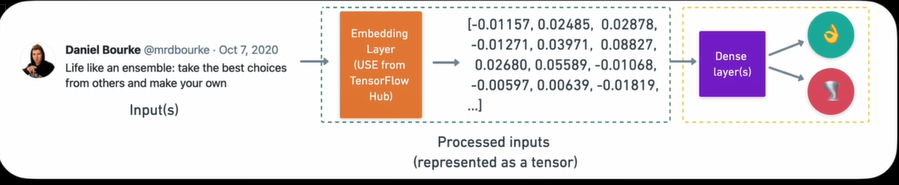

In [88]:
import tensorflow_hub as hub

In [89]:
embed=hub.load('https://tfhub.dev/google/universal-sentence-encoder/4')

In [90]:
embed_sample=embed([sample_sentence,
                    'When you call the universal sentence encoder on a sentence, it converts them into numbers'])

In [91]:
embed_sample.shape

TensorShape([2, 512])

In [92]:
# Create a keras layer using the use pretrained layer from tensorflow hub
# This layer has built in text vecorization layer
sentence_encorder_layer=hub.KerasLayer('https://tfhub.dev/google/universal-sentence-encoder/4',
                                       input_shape=[],#Since input to this layer can take variable length so no size
                                       trainable=False,
                                       dtype=tf.string,
                                       name='USE')



In [93]:
# Using a sequential api
# This layer has built in text vecorization layer so need of text_vectorization
model6=tf.keras.Sequential([
    sentence_encorder_layer,
    #tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
],name='Model_6_USE')

In [94]:
model6.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [95]:
model6.summary()

Model: "Model_6_USE"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 USE (KerasLayer)            (None, 512)               256797824 
                                                                 
 dense_5 (Dense)             (None, 1)                 513       
                                                                 
Total params: 256,798,337
Trainable params: 513
Non-trainable params: 256,797,824
_________________________________________________________________


In [96]:
history6=model6.fit(train_sentences,
                    train_labels,
                    epochs=5,
                    validation_data=(val_sentences,val_labels),
                    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                           'model6_feature_extractor')])

Saving TensorBoard log files to: model_logs/model6_feature_extractor/20220821-141948
Epoch 1/5
215/215 [==============================] - 5s 13ms/step - loss: 0.6430 - accuracy: 0.7552 - val_loss: 0.6079 - val_accuracy: 0.7808
Epoch 2/5
215/215 [==============================] - 2s 11ms/step - loss: 0.5767 - accuracy: 0.7907 - val_loss: 0.5593 - val_accuracy: 0.7874
Epoch 3/5
215/215 [==============================] - 2s 11ms/step - loss: 0.5350 - accuracy: 0.7968 - val_loss: 0.5286 - val_accuracy: 0.7874
Epoch 4/5
215/215 [==============================] - 2s 11ms/step - loss: 0.5072 - accuracy: 0.7994 - val_loss: 0.5083 - val_accuracy: 0.7861
Epoch 5/5
215/215 [==============================] - 2s 11ms/step - loss: 0.4877 - accuracy: 0.8016 - val_loss: 0.4940 - val_accuracy: 0.7874


In [97]:
model6_pred_probs=model6.predict(val_sentences)

model6_pred=tf.squeeze(tf.round(model6_pred_probs))

In [98]:
model6_results=evaluate_metrics(val_labels,model6_pred)

In [99]:
model6_results

{'accuracy': 0.7874015748031497,
 'precision': 0.7878968015414602,
 'recall': 0.7874015748031497,
 'f1-score': 0.7862340407224946}

### Model6.1: Adding more layer

In [100]:
# Using a sequential api
# This layer has built in text vecorization layer so need of text_vectorization
model6_1=tf.keras.Sequential([
    sentence_encorder_layer,
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
],name='Model_6_1_USE')

In [101]:
model6_1.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [102]:
model6_1.summary()

Model: "Model_6_1_USE"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 USE (KerasLayer)            (None, 512)               256797824 
                                                                 
 dense_6 (Dense)             (None, 64)                32832     
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                                 
Total params: 256,830,721
Trainable params: 32,897
Non-trainable params: 256,797,824
_________________________________________________________________


In [103]:
history6_1=model6_1.fit(train_sentences,
                    train_labels,
                    epochs=5,
                    validation_data=(val_sentences,val_labels),
                    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                           'model6_1_feature_extractor')])

Saving TensorBoard log files to: model_logs/model6_1_feature_extractor/20220821-142011
Epoch 1/5
215/215 [==============================] - 4s 13ms/step - loss: 0.5090 - accuracy: 0.7746 - val_loss: 0.4475 - val_accuracy: 0.8018
Epoch 2/5
215/215 [==============================] - 2s 11ms/step - loss: 0.4148 - accuracy: 0.8137 - val_loss: 0.4406 - val_accuracy: 0.8097
Epoch 3/5
215/215 [==============================] - 2s 11ms/step - loss: 0.4031 - accuracy: 0.8190 - val_loss: 0.4378 - val_accuracy: 0.8136
Epoch 4/5
215/215 [==============================] - 5s 22ms/step - loss: 0.3946 - accuracy: 0.8250 - val_loss: 0.4313 - val_accuracy: 0.8136
Epoch 5/5
215/215 [==============================] - 4s 20ms/step - loss: 0.3878 - accuracy: 0.8269 - val_loss: 0.4274 - val_accuracy: 0.8163


In [104]:
model6_1_pred_probs=model6_1.predict(val_sentences)

model6_1_pred=tf.squeeze(tf.round(model6_1_pred_probs))

In [105]:
model6_1_results=evaluate_metrics(val_labels,model6_1_pred)

In [106]:
model6_1_results

{'accuracy': 0.8162729658792651,
 'precision': 0.8171942902323678,
 'recall': 0.8162729658792651,
 'f1-score': 0.8152639858095633}

In [107]:
baseline_results

{'accuracy': 0.7926509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1-score': 0.7862189758049549}

### Model 7: TF Hub Pretrained USE but with 10% of the dataset

Transfer learning helps when you don't have large dataset.

To see how our model performs on a smaller dataset, let's replicate model6 we'll train it on 10%

Results are same or even better than model 6 but the data was only 10% of the data. This is because we used the validation data with the training data and it's causing data leak

In [108]:
#train_10_percent=train_sentences
#train_sentences_10_percent,train_labels_10_percent=train_10_percent['text'].to_list(),train_10_percent['target'].to_list()

In [109]:
train_10_percent_split=int(0.1*len(train_sentences))
train_sentences_10_percent=train_sentences[:train_10_percent_split]
train_labels_10_percent=train_labels[:train_10_percent_split]

In [111]:
len(train_sentences_10_percent),len(train_labels_10_percent)

(685, 685)

In [112]:
#check no of targets in our subset of data
np.unique(train_labels_10_percent,return_counts=True)

(array([0, 1]), array([406, 279]))

In [113]:
train_df['target'].value_counts()

0    4342
1    3271
Name: target, dtype: int64

Ratio is quite similar to the real dataset

In [114]:
## Cloning model6

model7=tf.keras.models.clone_model(model6_1)

In [115]:
model7.compile(loss=tf.keras.losses.binary_crossentropy,
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])

In [116]:
history7=model7.fit(train_sentences_10_percent,
                    train_labels_10_percent,
                    epochs=5,
                    validation_data=(val_sentences,val_labels),
                    callbacks=[create_tensorboard_callback(SAVE_DIR,
                                                           'model7_10percent_feature_extractor_correct')])

Saving TensorBoard log files to: model_logs/model7_10percent_feature_extractor_correct/20220821-142118
Epoch 1/5
22/22 [==============================] - 3s 43ms/step - loss: 0.6671 - accuracy: 0.6876 - val_loss: 0.6476 - val_accuracy: 0.7218
Epoch 2/5
22/22 [==============================] - 1s 25ms/step - loss: 0.5941 - accuracy: 0.8073 - val_loss: 0.5920 - val_accuracy: 0.7585
Epoch 3/5
22/22 [==============================] - 1s 25ms/step - loss: 0.5196 - accuracy: 0.8307 - val_loss: 0.5384 - val_accuracy: 0.7664
Epoch 4/5
22/22 [==============================] - 0s 21ms/step - loss: 0.4619 - accuracy: 0.8219 - val_loss: 0.5070 - val_accuracy: 0.7690
Epoch 5/5
22/22 [==============================] - 1s 44ms/step - loss: 0.4212 - accuracy: 0.8350 - val_loss: 0.4925 - val_accuracy: 0.7769


In [117]:
model7_pred_probs=model7.predict(val_sentences)

model7_pred=tf.squeeze(tf.round(model7_pred_probs))

In [118]:
model7_results=evaluate_metrics(val_labels,model7_pred)

In [119]:
model7_results

{'accuracy': 0.7769028871391076,
 'precision': 0.7772431692902212,
 'recall': 0.7769028871391076,
 'f1-score': 0.7756776970544694}

Even with 10 percent of the data it's performing good

## Comparing Model Results

In [120]:
#combine model results in dataframe
import pandas as pd
results=pd.DataFrame({'baseline':baseline_results,'Simple Dense':model1_results,
                      'lstm':model2_results,'gru':model3_results,
                      'bidirectional':model4_results,'conv1d':model5_results,
                      'tf_hub_use_encoder':model6_results,'tf_use_encoder_double_dense':model6_1_results,
                      'tf_hub_use_10%':model7_results})

In [121]:
results

,baseline,Simple Dense,lstm,gru,bidirectional,conv1d,tf_hub_use_encoder,tf_use_encoder_double_dense,tf_hub_use_10%
accuracy,0.792651,0.788714,0.776903,0.769029,0.780840,0.757218,0.787402,0.816273,0.776903
precision,0.811139,0.794846,0.780969,0.769124,0.783784,0.757465,0.787897,0.817194,0.777243
recall,0.792651,0.788714,0.776903,0.769029,0.780840,0.757218,0.787402,0.816273,0.776903
f1-score,0.786219,0.785369,0.773917,0.767865,0.778400,0.755713,0.786234,0.815264,0.775678


In [122]:
results=results.transpose()

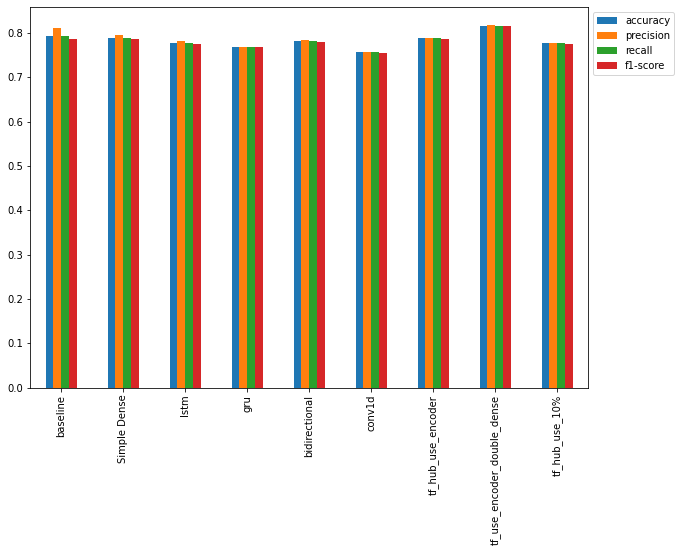

In [123]:

results.plot(kind='bar',figsize=(10,7)).legend(bbox_to_anchor=(1.0,1.0))

If all the models are capping at the same place, this might mean they cannot learn anymore with the data. This might be becuase of small dataset, low variance, or maybe it's not clean enough

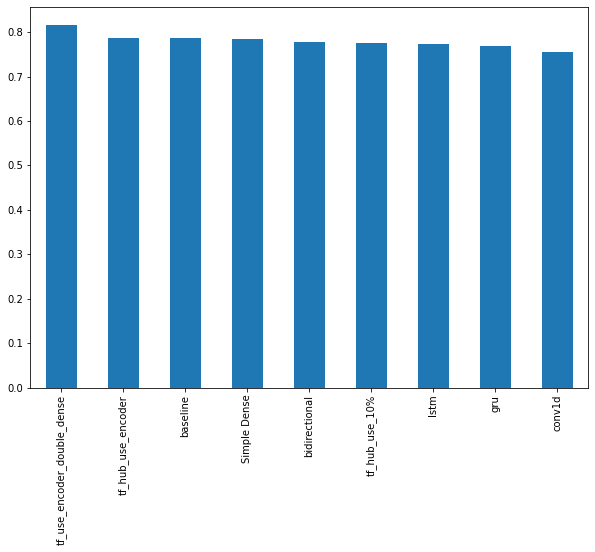

In [124]:
results.sort_values('f1-score',ascending=False)['f1-score'].plot(kind='bar',figsize=(10,7))

In [125]:
%load_ext tensorboard

In [126]:
%tensorboard --logdir model_logs

<IPython.core.display.Javascript object>

## Saving model 

### HDF5 Format

In [127]:

# Save TF Hub sentence encoder model to hdf5 format
model6_1.save('model6_1.h5')

In [128]:
import tensorflow_hub as hub
#Custom object is necessary here to load the model with tfhub models
loaded_model6_1=tf.keras.models.load_model('model6_1.h5',
                                    custom_objects={'KerasLayer':hub.KerasLayer})

Without custom object argument it will generate an error.

In [129]:
loaded_model6_1_without=tf.keras.models.load_model('model6_1.h5')

ValueError: ignored

In [130]:
loaded_model6_1.evaluate(val_sentences,val_labels)

24/24 [==============================] - 1s 18ms/step - loss: 0.4274 - accuracy: 0.8163


[0.4273812472820282, 0.8162729740142822]

### Saved model format

In [131]:
model6_1.save('savedModel_6')

In [132]:
loaded_savedmodel=tf.keras.models.load_model('savedModel_6')

## Finding the most wrong predictions

* If our model still isn't perfect, what examples is it getting wrong?

* And of these wrong examples which is getting most wrong.

For example if a sample should have label of 0 but our model is predicting closer to 1

In [176]:
pred_probs=model6_1.predict(val_sentences)

In [177]:
pred_probs=tf.squeeze(pred_probs)

In [178]:
preds=tf.round(pred_probs)

In [179]:
df=pd.DataFrame({'text':val_sentences,
                 'labels':val_labels,
                 'pred':preds,
                 'pred_probs':pred_probs})

In [180]:
df['pred']=df['pred'].apply(lambda x:int(x)) 

In [181]:
df.head(5)

,text,labels,pred,pred_probs
0,DFR EP016 Monthly Meltdown - On Dnbheaven 2015...,0,0,0.174718
1,FedEx no longer to transport bioterror germs i...,0,1,0.799383
2,Gunmen kill four in El Salvador bus attack: Su...,1,1,0.989643
3,@camilacabello97 Internally and externally scr...,1,0,0.190969
4,Radiation emergency #preparedness starts with ...,1,1,0.765455


In [184]:
most_wrong=df[df['labels']!=df['pred']].sort_values('pred_probs',ascending=False)

In [185]:
most_wrong[:10] #False positive

,text,labels,pred,pred_probs
31,? High Skies - Burning Buildings ? http://t.co...,0,1,0.912953
759,FedEx will no longer transport bioterror patho...,0,1,0.891737
628,@noah_anyname That's where the concentration c...,0,1,0.867266
49,@madonnamking RSPCA site multiple 7 story high...,0,1,0.863694
209,Ashes 2015: AustraliaÛªs collapse at Trent Br...,0,1,0.841454
393,@SonofLiberty357 all illuminated by the bright...,0,1,0.833706
251,@AshGhebranious civil rights continued in the ...,0,1,0.829402
1,FedEx no longer to transport bioterror germs i...,0,1,0.799383
109,[55436] 1950 LIONEL TRAINS SMOKE LOCOMOTIVES W...,0,1,0.792252
119,@freefromwolves GodsLove &amp; #thankU brother...,0,1,0.789116


In [186]:
most_wrong.tail(10) #False negative

,text,labels,pred,pred_probs
294,Lucas Duda is Ghost Rider. Not the Nic Cage ve...,1,0,0.063862
536,@DavidVonderhaar At least you were sincere ??,1,0,0.059855
221,going to redo my nails and watch behind the sc...,1,0,0.055414
408,@willienelson We need help! Horses will die!Pl...,1,0,0.052523
59,You can never escape me. Bullets don't harm me...,1,0,0.050506
233,I get to smoke my shit in peace,1,0,0.043534
411,@SoonerMagic_ I mean I'm a fan but I don't nee...,1,0,0.041683
38,Why are you deluged with low self-image? Take ...,1,0,0.033976
23,Ron &amp; Fez - Dave's High School Crush https...,1,0,0.031055
244,Reddit Will Now QuarantineÛ_ http://t.co/pkUA...,1,0,0.028126


Let's remind ourselves 

1: Disaster

0: Not disaster

In [187]:
#visualize false positives

for row in most_wrong[:10].itertuples():
  _,text,target,pred,pred_prob=row
  print(f'Target: {target}, Pred: {pred}, Prob:{pred_prob}')
  print(f"text:\n{text}\n")
  print('----\n')

Target: 0, Pred: 1, Prob:0.91295325756073
text:
? High Skies - Burning Buildings ? http://t.co/uVq41i3Kx2 #nowplaying

----

Target: 0, Pred: 1, Prob:0.8917368054389954
text:
FedEx will no longer transport bioterror pathogens in wake of anthrax lab mishaps http://t.co/lHpgxc4b8J

----

Target: 0, Pred: 1, Prob:0.8672659397125244
text:
@noah_anyname That's where the concentration camps and mass murder come in. 
 
EVERY. FUCKING. TIME.

----

Target: 0, Pred: 1, Prob:0.8636942505836487
text:
@madonnamking RSPCA site multiple 7 story high rise buildings next to low density character residential in an area that floods

----

Target: 0, Pred: 1, Prob:0.8414540886878967
text:
Ashes 2015: AustraliaÛªs collapse at Trent Bridge among worst in history: England bundled out Australia for 60 ... http://t.co/t5TrhjUAU0

----

Target: 0, Pred: 1, Prob:0.8337056040763855
text:
@SonofLiberty357 all illuminated by the brightly burning buildings all around the town!

----

Target: 0, Pred: 1, Prob:0.829

In [189]:
#visualize false Negative

for row in most_wrong[-10:].itertuples():
  _,text,target,pred,pred_prob=row
  print(f'Target: {target}, Pred: {pred}, Prob:{pred_prob}')
  print(f"text:\n{text}\n")
  print('----\n')

Target: 1, Pred: 0, Prob:0.0638624057173729
text:
Lucas Duda is Ghost Rider. Not the Nic Cage version but an actual 'engulfed in flames' badass. #Mets

----

Target: 1, Pred: 0, Prob:0.05985531210899353
text:
@DavidVonderhaar At least you were sincere ??

----

Target: 1, Pred: 0, Prob:0.05541400983929634
text:
going to redo my nails and watch behind the scenes of desolation of smaug ayyy

----

Target: 1, Pred: 0, Prob:0.052522704005241394
text:
@willienelson We need help! Horses will die!Please RT &amp; sign petition!Take a stand &amp; be a voice for them! #gilbert23 https://t.co/e8dl1lNCVu

----

Target: 1, Pred: 0, Prob:0.05050639435648918
text:
You can never escape me. Bullets don't harm me. Nothing harms me. But I know pain. I know pain. Sometimes I share it. With someone like you.

----

Target: 1, Pred: 0, Prob:0.04353403300046921
text:
I get to smoke my shit in peace

----

Target: 1, Pred: 0, Prob:0.04168270155787468
text:
@SoonerMagic_ I mean I'm a fan but I don't need a gir

## Prediction on test dataset

In [192]:
pred_probs=model6_1.predict(test_df['text'].to_list())

In [193]:
pred_probs=tf.squeeze(pred_probs)
preds=tf.round(pred_probs)

In [194]:
df=pd.DataFrame({'text':test_df['text'].to_list(),
                 'pred':preds,
                 'pred_probs':pred_probs})

In [195]:
df.head(5)

,text,pred,pred_probs
0,Just happened a terrible car crash,1.0,0.598877
1,"Heard about #earthquake is different cities, s...",1.0,0.911807
2,"there is a forest fire at spot pond, geese are...",1.0,0.869846
3,Apocalypse lighting. #Spokane #wildfires,1.0,0.938896
4,Typhoon Soudelor kills 28 in China and Taiwan,1.0,0.963412


In [200]:
#visualize preds

for row in df[:20].itertuples():
  _,text,pred,pred_prob=row
  print(f'Pred: {pred}, Prob:{pred_prob}')
  print(f"text:\n{text}\n")
  print('----\n')

Pred: 1.0, Prob:0.5988770723342896
text:
Just happened a terrible car crash

----

Pred: 1.0, Prob:0.9118074178695679
text:
Heard about #earthquake is different cities, stay safe everyone.

----

Pred: 1.0, Prob:0.8698464632034302
text:
there is a forest fire at spot pond, geese are fleeing across the street, I cannot save them all

----

Pred: 1.0, Prob:0.9388956427574158
text:
Apocalypse lighting. #Spokane #wildfires

----

Pred: 1.0, Prob:0.9634119272232056
text:
Typhoon Soudelor kills 28 in China and Taiwan

----

Pred: 1.0, Prob:0.5975319743156433
text:
We're shaking...It's an earthquake

----

Pred: 0.0, Prob:0.06654494255781174
text:
They'd probably still show more life than Arsenal did yesterday, eh? EH?

----

Pred: 0.0, Prob:0.04323703423142433
text:
Hey! How are you?

----

Pred: 0.0, Prob:0.042116984724998474
text:
What a nice hat?

----

Pred: 0.0, Prob:0.04883705452084541
text:
Fuck off!

----

Pred: 0.0, Prob:0.07769376784563065
text:
No I don't like cold!

----

Pred: 0

## The Speed/score Tradeoff

In [201]:
model6_1_results

{'accuracy': 0.8162729658792651,
 'precision': 0.8171942902323678,
 'recall': 0.8162729658792651,
 'f1-score': 0.8152639858095633}

In [202]:
baseline_results

{'accuracy': 0.7926509186351706,
 'precision': 0.8111390004213173,
 'recall': 0.7926509186351706,
 'f1-score': 0.7862189758049549}

In [203]:
import time
def pred_timer(model,samples):
  start_time=time.perf_counter()
  model.predict(samples)
  end_time=time.perf_counter()
  total_time=end_time-start_time
  time_per_pred=total_time/len(samples)
  return total_time,time_per_pred

In [208]:
# calculate tf hub sentence encoder time per pred
time0=pred_timer(model6_1,val_sentences)

In [209]:
time1=pred_timer(model0,val_sentences)

You can see if you need fast models then the baseline model is better than the deep learning model.

Text(0, 0.5, 'f1-score')

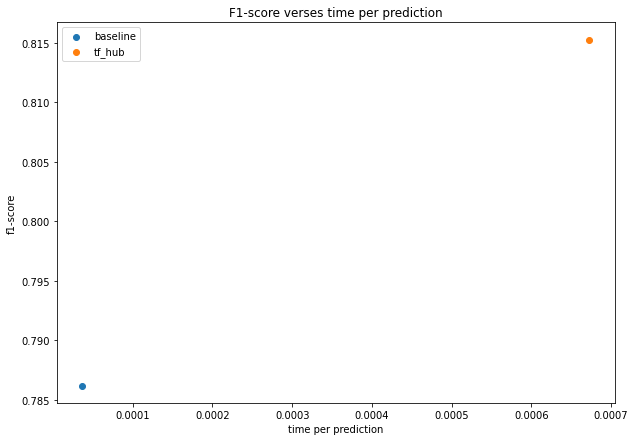

In [211]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,7))
plt.scatter(time1[1],baseline_results['f1-score'],label='baseline')
plt.scatter(time0[1],model6_1_results['f1-score'],label='tf_hub')
plt.legend()
plt.title('F1-score verses time per prediction')
plt.xlabel('time per prediction')
plt.ylabel('f1-score')

The ideal position here is the top left corner. minimum time per pred and highest accuracy